<a href="https://colab.research.google.com/github/kis-balazs/machine-learning/blob/main/MI_Attack.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# setup

In [1]:
import os
import time
import numpy as np
from matplotlib import pyplot as plt
from google.colab import drive
import h5py

In [2]:
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader

import torchvision.utils as tvls

In [3]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [10]:
# Balazs
%cd "/content/drive/MyDrive/University/2. UniStuttgart MSc./Studies/2022W/Machine Perception and Learning/Project"

/content/drive/MyDrive/University/2. UniStuttgart MSc./Studies/2022W/Machine Perception and Learning/Project


In [5]:
# Mohamed / Ekaterina
# %cd "/content/drive/MyDrive/Project"

[Errno 2] No such file or directory: '/content/drive/MyDrive/Project'
/content


# TODO List

- Dataset:
 - [preproc code](https://github.com/hysts/pytorch_mpiigaze)
 - ~~feature: img, target: pID~~
---
- Classifier:
 - ~~predicts pID~~
 - ~~splitting based on train/val/test (80-10-10)~~
   - ~~VGG18 (mandatory)~~
   - ~~Custom Classifier~~
   - ~~ResNet152~~
---
- overall:
 - [code](https://github.com/MKariya1998/GMI-Attack/tree/master/Celeba)
 - auxiliary knowledge creator (IP) - Ekaterina
   - ~~add powerful gaussian blur and masking (meta-function) to be used for central/chess masking~~
 - target (gets G image and theroetical label => target loss)
   - ~~attack with noise~~
   - attack with aux knowledge
 - D (G image => D loss) - Mohamed & Balazs
   - ~~add code for D & G together with training utilities~~
   - ~~training GAN from noise~~
   - training GAN from aux knowledge

# Utils

In [6]:
def create_dataset(rng):
    f = h5py.File('datasets/MPIIFaceGaze.h5', 'r')
    imgs = np.array([])
    targets = np.array([])

    # private dataset
    for i in rng:
        print('$ {:02}...'.format(i), end='')
        img = np.array(
            [x[()][...,::-1] for x in list(f['p{:02}'.format(i)]['image'].values())]
        )
        t = np.array([i for x in range(len(img))])
        
        if not np.any(imgs):
            imgs = img
        else:
            imgs = np.append(imgs, img, axis=0)

        targets = np.append(targets, t, axis=0)
        print(len(imgs))

        plt.imshow(img[0])
        plt.title(t[0])
        plt.show()
    return imgs, targets

In [7]:
from torchvision import transforms

# works both for resnet and vgg
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transformGAN = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

In [8]:
# Define a class for custom dataset
class DS(Dataset):
	def __init__(self, x, y, transforms=None):
		self.x = x
		self.y = torch.LongTensor(y)
		self.t = transforms
		
	def __getitem__(self, index):
		if self.t:
			return self.t(self.x[index]), self.y[index]
		else:
			return self.x[index], self.y[index]

	def __len__(self):
		return len(self.x)

# Setup Dataset

In [ ]:
%pwd

In [ ]:
# %mkdir -p datasets
# %cd datasets
# !wget http://datasets.d2.mpi-inf.mpg.de/MPIIGaze/MPIIFaceGaze_normalized.zip
# !unzip MPIIFaceGaze_normalized.zip
# %mv MPIIFaceGaze_normalizad MPIIFaceGaze_normalized
# %cd ..

In [ ]:
# !python src/preproc.py --dataset datasets/MPIIFaceGaze_normalized -o datasets/

---
# Target Network(s) (VGG16 + custom, ResNet-152)

## Data Preprocessing

In [ ]:
%pwd

'/content/drive/MyDrive/University/2. UniStuttgart MSc./Studies/2022W/Machine Perception and Learning/Project'

$ 00...3000


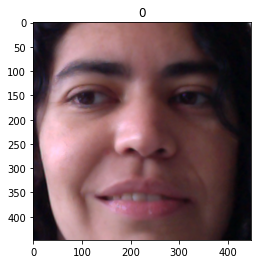

$ 01...6000


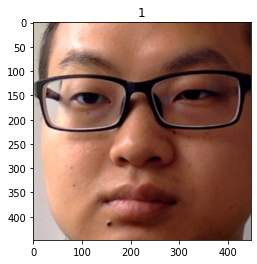

$ 02...9000


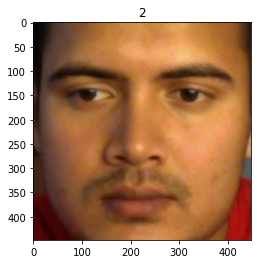

$ 03...12000


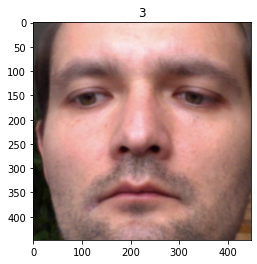

$ 04...15000


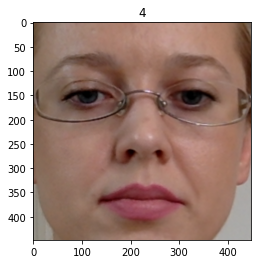

$ 05...18000


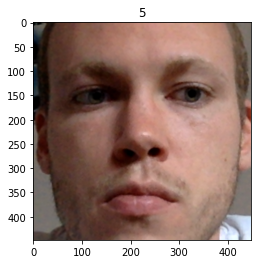

$ 06...21000


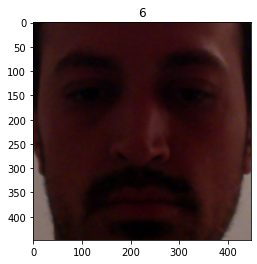

$ 07...24000


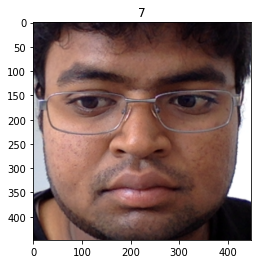

$ 08...27000


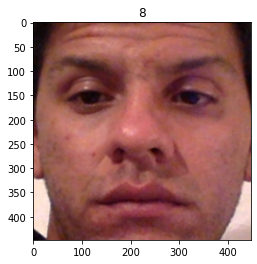

$ 09...30000


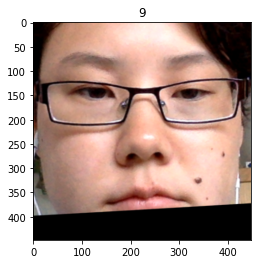

In [ ]:
target_x, target_y = create_dataset(range(10))

In [ ]:
target_x.shape

(30000, 448, 448, 3)

In [ ]:
target_x, target_test_x, target_y, target_test_y = train_test_split(
    target_x, target_y, test_size=.1, random_state=42, shuffle=True
)
target_x, target_val_x, target_y, target_val_y = train_test_split(
    target_x, target_y, test_size=.11111, random_state=42, shuffle=True
)

print('Train:', target_x.shape)
print('Val:', target_val_x.shape)
print('Test:', target_test_x.shape)

Train: (24000, 448, 448, 3)
Val: (3000, 448, 448, 3)
Test: (3000, 448, 448, 3)


2.0


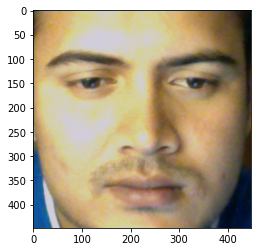

In [ ]:
print(target_y[12345])
plt.imshow(target_x[12345])
plt.show()

## ML

#### ML setup

In [ ]:
# Create train, validation, test Dataset
train = DS(target_x, target_y, transform)
val = DS(target_val_x, target_val_y, transform)
test = DS(target_test_x, target_test_y, transform)

In [ ]:
train_loader = DataLoader(train, bwe, shuffle=True)
val_loader = DataLoader(val, batch_size=64, shuffle=True)
test_loader = DataLoader(test, batch_size=64, shuffle=True)

In [ ]:
%cd src/

/content/drive/MyDrive/University/2. UniStuttgart MSc./Studies/2022W/Machine Perception and Learning/Project/src


In [ ]:
from target_network import VGG16, CustomTNet, ResNet152

import torch.nn as nn
import torch.optim as optim

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
device

'cuda'

#### utility

In [ ]:
def train(net, output_file):
    train_loss = []
    val_loss = []

    net = net.to(device)

    # Early Stopping
    es_condition = 3
    es_it = 0
    es_loss = np.inf

    # ###
    print('!! Training start...')
    for epoch in range(20):
        net.train()
        tloss, tacc = [], []
        for iter, (x, y) in enumerate(train_loader):
            x = x.to(device)
            y = y.to(device)
            y_hat = net(x)
            loss = crit(y_hat, y)
            tloss.append(loss.item())
            
            opt.zero_grad()
            
            loss.backward()
            opt.step()
            
            argmax_Y = torch.max(y_hat.data, 1)[1].view(-1, 1)
            tacc.append((y.float().view(-1, 1) == argmax_Y.float()).sum().item() / len(y.float().view(-1, 1)) * 100)
        # ###
        tloss = np.mean(np.array(tloss))
        tacc = np.mean(np.array(tacc))
        train_loss.append(tloss)

        # #####
        net.eval()
        vloss, vacc = [], []
        for iter, (x, y) in enumerate(val_loader):
            x = x.to(device)
            y = y.to(device)
            y_hat = net(x)
            loss = crit(y_hat, y)
            vloss.append(loss.item())

            argmax_Y = torch.max(y_hat.data, 1)[1].view(-1, 1)
            vacc.append((y.float().view(-1, 1) == argmax_Y.float()).sum().item() / len(y.float().view(-1, 1)) * 100)
        # ###
        vloss = np.mean(np.array(vloss))
        vacc = np.mean(np.array(vacc))
        val_loss.append(vloss)

        if epoch % 2 == 0:
            print(f'Epoch {epoch}:')
            print(f' - loss: train: {tloss}, val: {vloss}')
            print(f' - ACC: train: {tacc}, val: {vacc}', end='\n')
        
        # ### Early Stopping ###
        if vloss < es_loss:
            print('* Early Stopping reset...')
            es_it = 0
            es_loss = vloss
        else:
            print('* Early Stopping increase...')
            es_it += 1
        if es_it == es_condition:
            print('*** Early Stopping!')
            break

    # save model
    torch.save(net.state_dict(), output_file)
    print('!! Training stop...')

    # ###
    import matplotlib.pyplot as plt
    x_axis = len(train_loss)
    plt.plot(np.arange(x_axis), train_loss, label='train losses')
    plt.plot(np.arange(x_axis), val_loss, label='val losses')
    plt.legend()
    plt.show()

In [ ]:
def test(net):
    net.eval()

    with torch.no_grad():
        taccs = []
        for iter, (x, y) in enumerate(test_loader):
            y_hat = net(x)

            # calculate accuracy
            argmax_Y = torch.max(y_hat, 1)[1].view(-1, 1)
            test_acc=((y.float().view(-1, 1)== argmax_Y.float()).sum().item()/len(y.float().view(-1, 1)) * 100)
            taccs.append(test_acc)
        return sum(taccs) / len(taccs)

### Target Network

#### train

In [ ]:
# create network model
net = VGG16(n_classes=10)
# loss function
crit = nn.CrossEntropyLoss()
# optimizer
opt = optim.SGD(net.parameters(), lr=10e-3, momentum=0.9, weight_decay=10e-4)

In [ ]:
train(
    net,
    "target-net.pt"
)

#### test

In [ ]:
# create network model
net = VGG16(n_classes=10)
net.load_state_dict(torch.load("target-net.pt"))
net = net.to('cpu')

print('Test accuracy:', test(net))

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Test accuracy: 99.96675531914893


#### test one sample

In [ ]:
random_idx = np.random.randint(3000)
x, y = target_x[random_idx], target_y[random_idx]

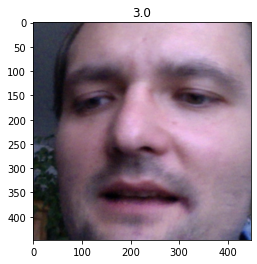

In [ ]:
plt.imshow(x)
plt.title(y)
plt.show()

In [ ]:
# won't map to device since CPU is used for inference :-?
x_t = transform(x).unsqueeze(0)  # [batch, channels, H, W]
y_hat = torch.argmax(net(x_t)).detach().numpy()
print(y_hat)

3


---
### Custom Network

#### train

In [ ]:
# create network model
cnet = CustomTNet(n_classes=10)
# loss function
crit = nn.CrossEntropyLoss()
# optimizer
opt = optim.SGD(cnet.parameters(), lr=10e-3, momentum=0.9, weight_decay=10e-4)

!! Training start...
Epoch 0:
 - loss: train: 1.0626860184872404, val: 0.7382570010550479
 - ACC: train: 71.5342420212766, val: 81.90539513677813
* Early Stopping reset...
* Early Stopping reset...
Epoch 2:
 - loss: train: 0.5036902589366791, val: 0.4925938667135036
 - ACC: train: 87.94464760638297, val: 88.15064589665653
* Early Stopping reset...
* Early Stopping reset...
Epoch 4:
 - loss: train: 0.4059229252978842, val: 0.40930509694079137
 - ACC: train: 90.10139627659575, val: 89.97910334346504
* Early Stopping reset...
* Early Stopping reset...
Epoch 6:
 - loss: train: 0.35556716170716796, val: 0.36140764742455583
 - ACC: train: 91.38131648936171, val: 91.34213525835865
* Early Stopping reset...
* Early Stopping reset...
Epoch 8:
 - loss: train: 0.324561347114913, val: 0.33579297807622466
 - ACC: train: 92.29554521276596, val: 91.73632218844985
* Early Stopping reset...
* Early Stopping reset...
Epoch 10:
 - loss: train: 0.30394071705163794, val: 0.31402236064697836
 - ACC: train: 

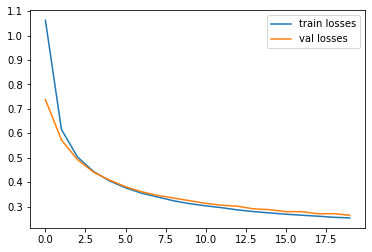

In [ ]:
train(
    cnet,
    "custom_target-net.pt"
)

#### test

In [ ]:
# create network model
cnet = CustomTNet(n_classes=10)
cnet.load_state_dict(torch.load("custom_target-net.pt"))
cnet = cnet.to('cpu')

print('Test accuracy:', test(cnet))

Test accuracy: 94.59061550151975


#### test one sample

In [ ]:
random_idx = np.random.randint(3000)
x, y = target_x[random_idx], target_y[random_idx]

x_t = transform(x).unsqueeze(0)  # [batch, channels, H, W]
y_hat = torch.argmax(cnet(x_t)).detach().numpy()

while y == y_hat:
    random_idx = np.random.randint(3000)
    x, y = target_x[random_idx], target_y[random_idx]

    x_t = transform(x).unsqueeze(0)  # [batch, channels, H, W]
    y_hat = torch.argmax(cnet(x_t)).detach().numpy()

print(random_idx)

2219


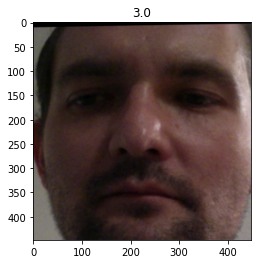

In [ ]:
plt.imshow(target_x[random_idx])
plt.title(target_y[random_idx])
plt.show()

In [ ]:
print(y_hat)

8


---
### EvalClassifier

#### train

In [ ]:
# create network model
ec_net = ResNet152(n_classes=10)
# loss function
crit = nn.CrossEntropyLoss()
# optimizer
opt = optim.SGD(ec_net.parameters(), lr=10e-3, momentum=0.9, weight_decay=10e-4)

In [ ]:
train(
    ec_net,
    "eval_class-net.pt"
)

#### test

In [ ]:
# create network model
ec_net = ResNet152(n_classes=10)
ec_net.load_state_dict(torch.load("eval_class-net.pt"))
ec_net = ec_net.to('cpu')

print('Test accuracy:', test(ec_net))

Test accuracy: 99.9002659574468


#### test one sample

In [ ]:
random_idx = np.random.randint(3000)
x, y = target_x[random_idx], target_y[random_idx]

In [ ]:
plt.imshow(x)
plt.title(y)
plt.show()

In [ ]:
# won't map to device since CPU is used for inference :-?
x_t = transform(x).unsqueeze(0)  # [batch, channels, H, W]
y_hat = torch.argmax(ec_net(x_t)).detach().numpy()
print(y_hat)

---
---
# IP

In [ ]:
target_x, _ = create_dataset(range(1))

In [ ]:
plt.imshow(target_x[5])
plt.show()

In [ ]:
from scipy.ndimage.filters import gaussian_filter

def aux_blur(img):
  return gaussian_filter(img, sigma=(20,20,0))

# img is 448x448
def aux_mask(img, start_x, start_y, len_x, len_y):
  grey = [100,100,100]
  masked = np.copy(img)
  masked[start_x:start_x + len_x,start_y:start_y + len_y] = grey
  return masked

In [ ]:
blurred = aux_blur(target_x[5])
plt.imshow(blurred)
plt.show()

In [ ]:
masked = aux_mask(target_x[7], 0, 0, 224, 224)
masked = aux_mask(masked, 224, 224, 224, 224)
plt.imshow(masked)
plt.show()

In [ ]:
masked = aux_mask(target_x[7], 112, 112, 224, 224)
plt.imshow(masked)
plt.show()

---
# GAN

## train

**Check PWD in *Project* root!!**

$ 10...3000


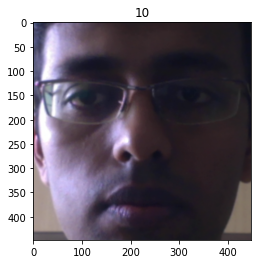

$ 11...6000


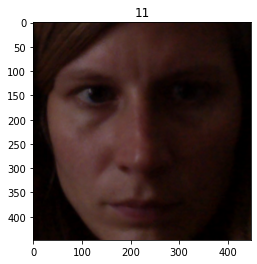

$ 12...9000


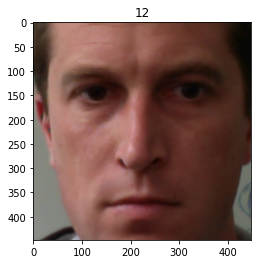

$ 13...12000


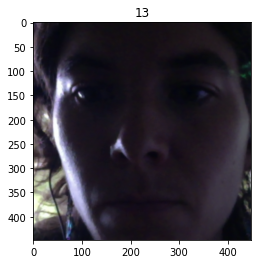

$ 14...15000


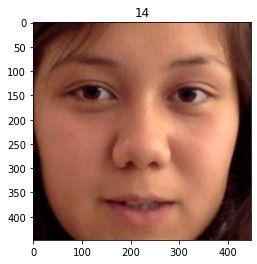

In [ ]:
shadow_x, shadow_y = create_dataset(np.arange(10, 15))

In [ ]:
%pwd

In [ ]:
%cd src/

In [ ]:
from gan import Gen, Discr
from gan import Utils

In [ ]:
lr = 1e-4
batch_size = 256
z_dim = 100
epochs = 200
n_critic = 5

# load data properly
gan_data = DS(shadow_x, shadow_y, transformGAN)
gan_loader = DataLoader(gan_data, batch_size=batch_size, shuffle=True)

dst_folder = 'gan_train224x224'

print("<<< Training [GAN] >>>")

G = Gen(z_dim)
DG = Discr(3)

G = torch.nn.DataParallel(G).cuda()
DG = torch.nn.DataParallel(DG).cuda()

g_optimizer = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
dg_optimizer = torch.optim.Adam(DG.parameters(), lr=lr, betas=(0.5, 0.999))

step = 0

for epoch in range(epochs):
    start = time.time()
    for i, (imgs, _) in enumerate(gan_loader):
        step += 1
        imgs = imgs.cuda()
        bs = imgs.size(0)  # batch size
        
        Utils.freeze(G)
        Utils.unfreeze(DG)

        z = torch.randn(bs, z_dim).cuda()
        f_imgs = G(z)

        r_logit = DG(imgs)
        f_logit = DG(f_imgs)
        
        wd = r_logit.mean() - f_logit.mean()  # Wasserstein-1 Distance
        gp = Utils.gradient_penalty(imgs.data, f_imgs.data, DG=DG)
        dg_loss = - wd + gp * 10.0
        
        dg_optimizer.zero_grad()
        dg_loss.backward()
        dg_optimizer.step()

        # train G
        if step % n_critic == 0:
            Utils.freeze(DG)
            Utils.unfreeze(G)

            z = torch.randn(bs, z_dim).cuda()
            f_imgs = G(z)
            logit_dg = DG(f_imgs)
            # calculate g_loss
            g_loss = - logit_dg.mean()
            
            g_optimizer.zero_grad()
            g_loss.backward()
            g_optimizer.step()

    end = time.time()
    print('dT[{}]: {:.3f}'.format(epoch + 1, end - start))

    if (epoch + 1) % 10 == 0:
        z = torch.randn(32, z_dim).cuda()
        fake_image = G(z)
        tvls.save_image(fake_image.detach(), "{}/result_image_{}.png".format(dst_folder, epoch + 1), nrow = 8, normalize=True)

    torch.save(G.state_dict(), "{}/G-net.tar".format(dst_folder))
    torch.save(DG.state_dict(), "{}/D-net.tar".format(dst_folder))

## attack

**Check PWD in *Project* root!!**

In [11]:
%pwd

'/content/drive/MyDrive/University/2. UniStuttgart MSc./Studies/2022W/Machine Perception and Learning/Project'

In [12]:
%cd src/

/content/drive/MyDrive/University/2. UniStuttgart MSc./Studies/2022W/Machine Perception and Learning/Project/src


In [13]:
from target_network import VGG16, CustomTNet, ResNet152

from gan import Gen, Discr
from gan import Utils

In [14]:
gan_src_folder = 'gan_train224x224'

In [15]:
identities = torch.arange(10)

In [16]:
T = VGG16(n_classes=10).cuda()
T.load_state_dict(torch.load("target-net.pt"))

cT = CustomTNet(n_classes=10).cuda()
cT.load_state_dict(torch.load("custom_target-net.pt"))

E = ResNet152(n_classes=10).cuda()
E.load_state_dict(torch.load("eval_class-net.pt"))

G = Gen(100)
G = nn.DataParallel(G).cuda()
G.load_state_dict(torch.load('{}/G-net.tar'.format(gan_src_folder)))

D = Discr(3)
D = nn.DataParallel(D).cuda()
D.load_state_dict(torch.load('{}/D-net.tar'.format(gan_src_folder)))

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

<All keys matched successfully>

In [17]:
print('$$$$$\nT:', T)
print('$$$$$\nT:', cT)
print('$$$$$\nT:', E)
print('$$$$$\nG:', G)
print('$$$$$\nD:', D)

$$$$$
T: VGG16(
  (feature): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2

In [ ]:
def attack(target_net, eval_net=None, g_net=None, d_net=None, iden=None):
    lr = 1e-2
    momentum = 0.9
    z_size = 100

    iden = iden.long().cuda()
    criterion = nn.CrossEntropyLoss().cuda()
    identity_number = iden.shape[0]  # batch size
	
    # set networks to inference mode
    target_net.eval()
    # eval_net.eval()
    g_net.eval()
    d_net.eval()

    max_score = torch.zeros(identity_number)
    max_iden = torch.zeros(identity_number)
    z_hat = torch.zeros(identity_number, z_size)

    it = 1
    for random_seed in range(5):
        tf = time.time()
		
        torch.manual_seed(random_seed) 
        torch.cuda.manual_seed(random_seed) 
        np.random.seed(random_seed)

        z = torch.randn(identity_number, z_size).cuda().float()
        z.requires_grad = True
        v = torch.zeros(identity_number, z_size).cuda().float()

        for i in range(1_500):
            fake = g_net(z)
            label = d_net(fake)
            out = target_net(fake)

            if z.grad is not None:
                z.grad.data.zero_()

            Prior_Loss = - label.mean()
            Iden_Loss = criterion(out, iden)
            Total_Loss = Prior_Loss + 100 * Iden_Loss

            Total_Loss.backward()

            # SGD
            v_prev = v.clone()
            gradient = z.grad.data
            v = momentum * v - lr * gradient
            z = z + ( - momentum * v_prev + (1 + momentum) * v)
            z = torch.clamp(z.detach(), -1, 1).float()
            z.requires_grad = True

            if (i + 1) % 300 == 0:
                fake_img = g_net(z.detach())

                f, axarr = plt.subplots(1, 10, figsize=(27, 48))
                for _i in range(10):
                    axarr[_i].imshow(fake_img[_i].permute(1, 2, 0).cpu().detach())
                plt.show()
                eval_prob = target_net(fake_img)
                eval_iden = torch.argmax(eval_prob, dim=1)
                print(eval_iden)
                acc = iden.eq(eval_iden.long()).sum().item() * 1.0 / identity_number
                print("[{}.{}]\tPrior Loss: {:.2f}\tIden Loss: {:.2f}\tAttack Acc: {:.2f}".format(it, i+1, Prior_Loss.item(), Iden_Loss.item(), acc))

            # print(i, end=', ')

        fake = g_net(z)
        score = target_net(fake)
        eval_prob = target_net(fake)
        eval_iden = torch.argmax(eval_prob, dim=1)
        
        cnt = 0
        for i in range(identity_number):
            gt = iden[i].item()
            # if after z => G => T the prediction is more certain that ID is i (in [0, 10]) 
            if score[i, i].item() > max_score[i].item():
                max_score[i] = score[i, i]
                max_iden[i] = eval_iden[i]
                # store the new optimal Z's
                z_hat[i, :] = z[i, :]
            if eval_iden[i].item() == gt:
                cnt += 1

        interval = time.time() - tf
        print("[{}]\tTime:{:.2f}\tAcc:{:.2f}\t".format(it, interval, cnt * 1.0 / identity_number))
        print('#' * 100)

        # increment to the next seed
        it += 1

    correct = 0
    for i in range(identity_number):
        gt = iden[i].item()
        if max_iden[i].item() == gt:
            correct += 1
    acc = correct * 1.0 / identity_number
    print("Attack Accuracy: {:.2f}".format(acc))

    return z_hat

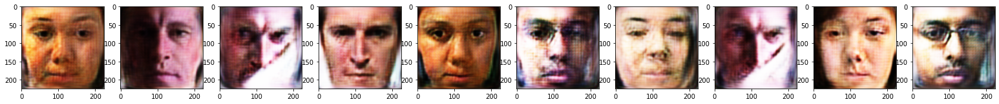

tensor([1, 1, 1, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[1.300]	Prior Loss: 189.95	Iden Loss: 3.63	Attack Acc: 0.30


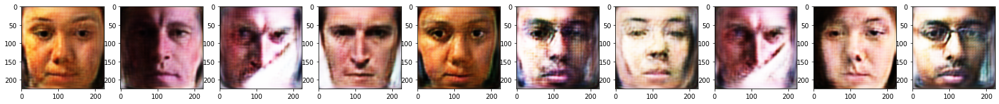

tensor([1, 1, 1, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[1.600]	Prior Loss: 179.74	Iden Loss: 3.25	Attack Acc: 0.30


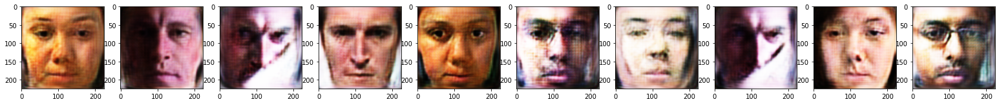

tensor([1, 1, 1, 3, 1, 5, 2, 1, 1, 1], device='cuda:0')
[1.900]	Prior Loss: 182.66	Iden Loss: 2.63	Attack Acc: 0.30


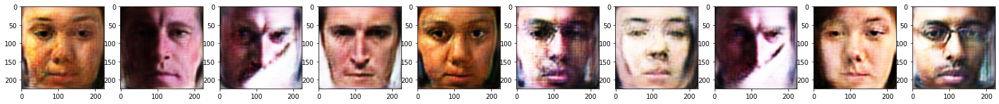

tensor([1, 1, 1, 3, 1, 5, 2, 1, 1, 1], device='cuda:0')
[1.1200]	Prior Loss: 182.18	Iden Loss: 2.94	Attack Acc: 0.30


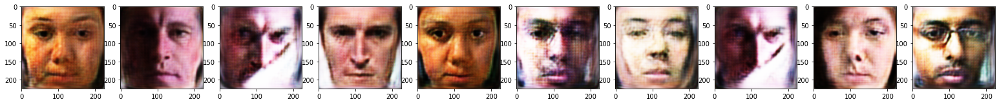

tensor([1, 1, 1, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[1.1500]	Prior Loss: 181.76	Iden Loss: 3.39	Attack Acc: 0.30
[1]	Time:108.24	Acc:0.30	
####################################################################################################


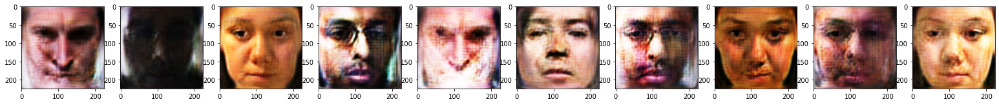

tensor([1, 1, 2, 3, 1, 5, 1, 1, 8, 1], device='cuda:0')
[2.300]	Prior Loss: 205.32	Iden Loss: 1.97	Attack Acc: 0.50


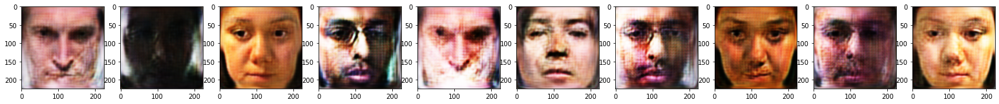

tensor([1, 1, 2, 3, 1, 5, 1, 1, 8, 1], device='cuda:0')
[2.600]	Prior Loss: 205.92	Iden Loss: 2.04	Attack Acc: 0.50


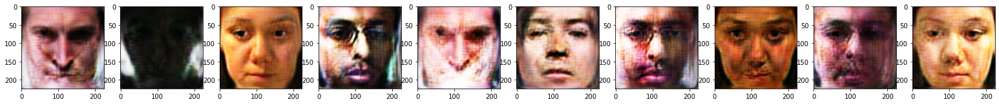

tensor([1, 1, 2, 3, 1, 5, 1, 1, 8, 1], device='cuda:0')
[2.900]	Prior Loss: 193.79	Iden Loss: 1.99	Attack Acc: 0.50


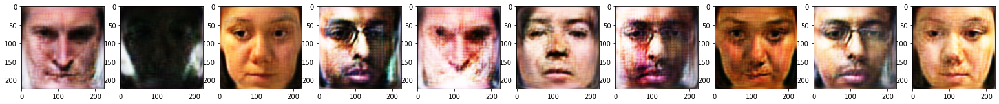

tensor([1, 1, 2, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[2.1200]	Prior Loss: 203.41	Iden Loss: 2.03	Attack Acc: 0.40


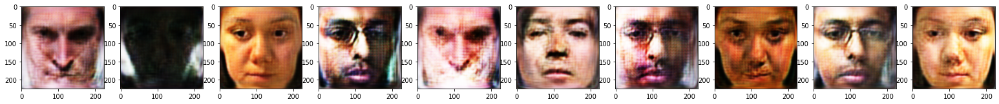

tensor([1, 1, 2, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[2.1500]	Prior Loss: 199.90	Iden Loss: 1.88	Attack Acc: 0.40
[2]	Time:108.81	Acc:0.40	
####################################################################################################


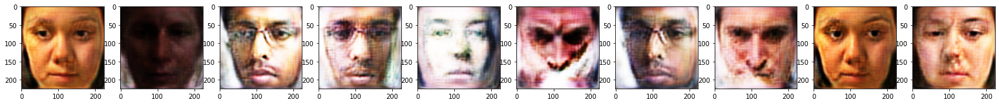

tensor([1, 1, 2, 3, 1, 1, 1, 1, 1, 1], device='cuda:0')
[3.300]	Prior Loss: 176.75	Iden Loss: 2.73	Attack Acc: 0.30


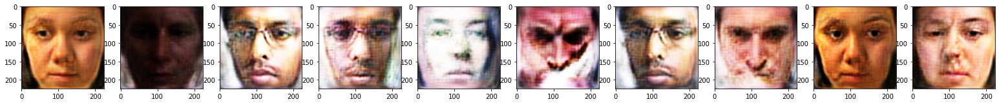

tensor([1, 1, 2, 3, 1, 1, 1, 1, 1, 1], device='cuda:0')
[3.600]	Prior Loss: 175.33	Iden Loss: 2.47	Attack Acc: 0.30


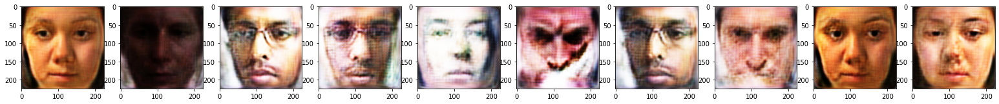

tensor([1, 1, 2, 3, 1, 1, 1, 1, 1, 1], device='cuda:0')
[3.900]	Prior Loss: 176.12	Iden Loss: 2.27	Attack Acc: 0.30


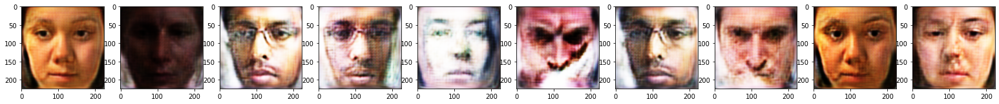

tensor([1, 1, 2, 3, 1, 1, 1, 1, 1, 1], device='cuda:0')
[3.1200]	Prior Loss: 172.99	Iden Loss: 2.31	Attack Acc: 0.30


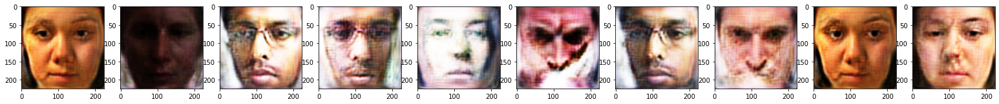

tensor([1, 1, 2, 3, 1, 1, 1, 1, 1, 1], device='cuda:0')
[3.1500]	Prior Loss: 177.57	Iden Loss: 2.40	Attack Acc: 0.30
[3]	Time:108.36	Acc:0.30	
####################################################################################################


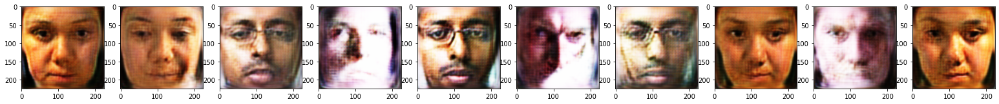

tensor([1, 1, 2, 3, 4, 1, 1, 1, 1, 1], device='cuda:0')
[4.300]	Prior Loss: 201.18	Iden Loss: 2.25	Attack Acc: 0.40


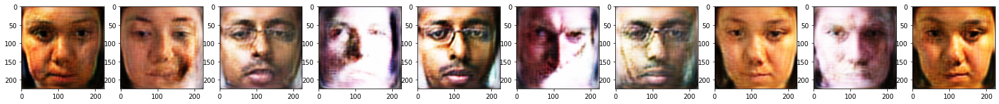

tensor([1, 1, 2, 3, 4, 1, 1, 1, 1, 1], device='cuda:0')
[4.600]	Prior Loss: 193.89	Iden Loss: 2.02	Attack Acc: 0.40


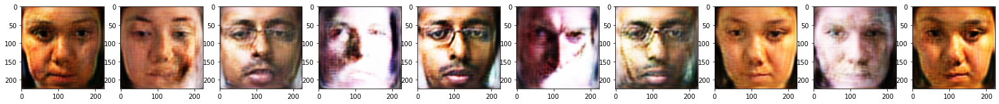

tensor([1, 1, 2, 3, 4, 1, 1, 1, 1, 1], device='cuda:0')
[4.900]	Prior Loss: 191.63	Iden Loss: 1.85	Attack Acc: 0.40


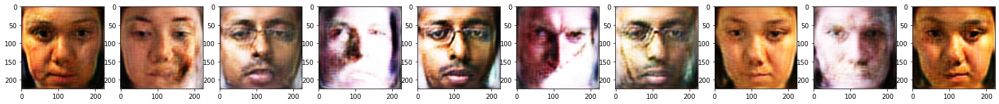

tensor([1, 1, 2, 3, 4, 1, 1, 1, 1, 1], device='cuda:0')
[4.1200]	Prior Loss: 191.04	Iden Loss: 2.13	Attack Acc: 0.40


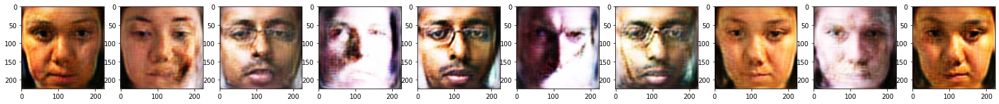

tensor([1, 1, 2, 3, 4, 1, 1, 1, 1, 1], device='cuda:0')
[4.1500]	Prior Loss: 190.49	Iden Loss: 1.96	Attack Acc: 0.40
[4]	Time:108.71	Acc:0.40	
####################################################################################################


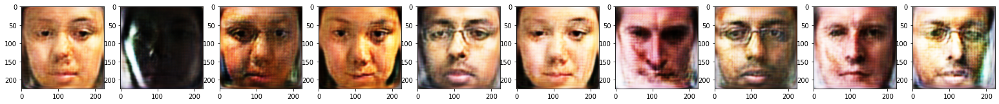

tensor([1, 1, 1, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[5.300]	Prior Loss: 202.62	Iden Loss: 2.19	Attack Acc: 0.30


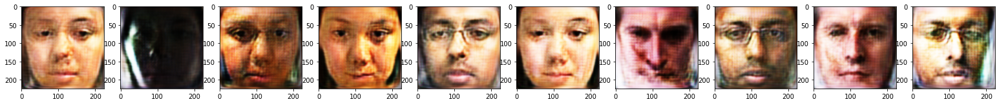

tensor([1, 1, 1, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[5.600]	Prior Loss: 209.03	Iden Loss: 2.50	Attack Acc: 0.30


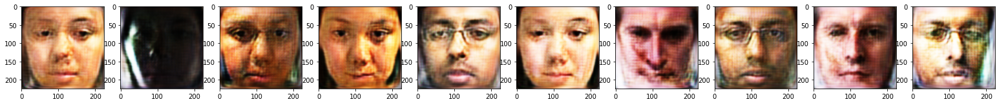

tensor([1, 1, 1, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[5.900]	Prior Loss: 202.07	Iden Loss: 1.98	Attack Acc: 0.30


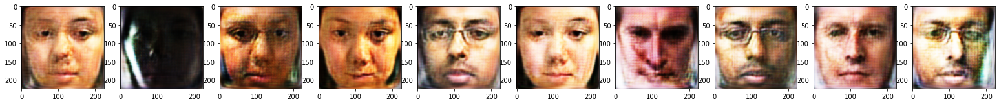

tensor([1, 1, 1, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[5.1200]	Prior Loss: 200.09	Iden Loss: 2.01	Attack Acc: 0.30


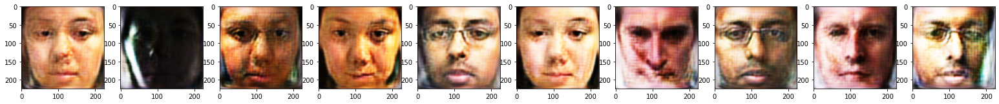

tensor([1, 1, 1, 3, 1, 5, 1, 1, 1, 1], device='cuda:0')
[5.1500]	Prior Loss: 205.35	Iden Loss: 1.94	Attack Acc: 0.30
[5]	Time:108.70	Acc:0.30	
####################################################################################################
Attack Accuracy: 0.50


In [ ]:
optim_z_s = attack(
    target_net=T,
    # eval_net=E,
    g_net=G,
    d_net=D,
    iden=identities
)

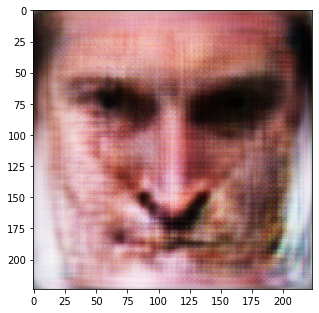

Expected ID: 0, resulting ID: tensor([1], device='cuda:0')


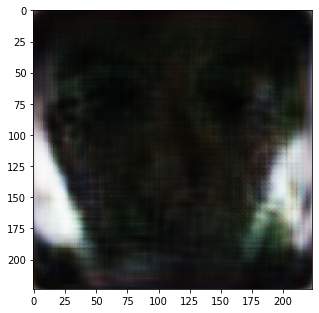

Expected ID: 1, resulting ID: tensor([1], device='cuda:0')


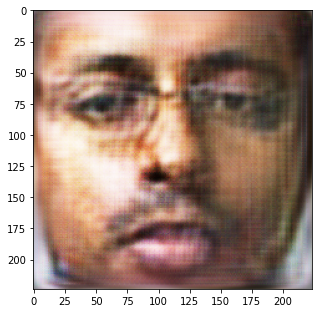

Expected ID: 2, resulting ID: tensor([2], device='cuda:0')


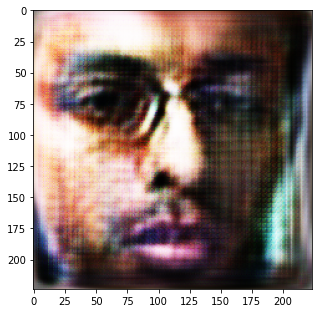

Expected ID: 3, resulting ID: tensor([3], device='cuda:0')


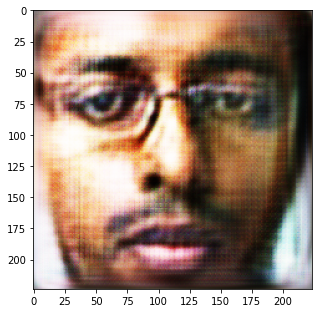

Expected ID: 4, resulting ID: tensor([4], device='cuda:0')


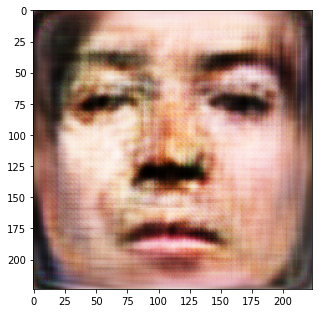

Expected ID: 5, resulting ID: tensor([5], device='cuda:0')


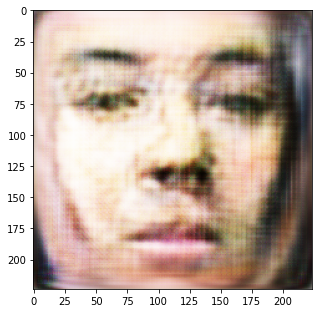

Expected ID: 6, resulting ID: tensor([1], device='cuda:0')


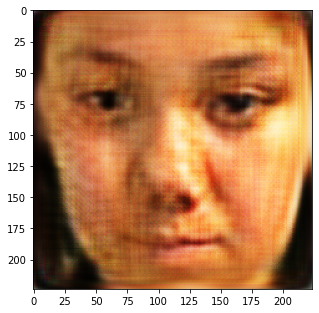

Expected ID: 7, resulting ID: tensor([1], device='cuda:0')


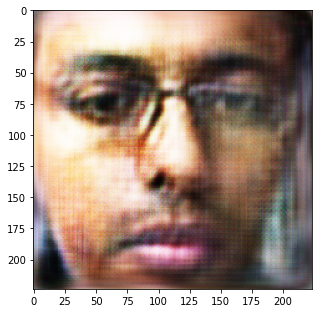

Expected ID: 8, resulting ID: tensor([1], device='cuda:0')


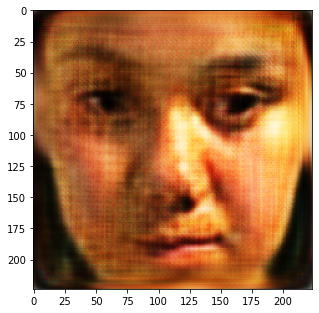

Expected ID: 9, resulting ID: tensor([1], device='cuda:0')


In [ ]:
for i in range(10):
    z = optim_z_s[i]
    fake = G(z.unsqueeze(0))
    plt.imshow(fake.squeeze(0).permute(1, 2, 0).cpu().detach())
    plt.show()
    pred = T(fake)
    pred_id = torch.argmax(pred, dim=1)
    print('Expected ID: {}, resulting ID: {}'.format(i, pred_id))